# Figures corrected

In [1]:
# dependencies
import numpy as np 
import matplotlib.pyplot as plt
import xarray as xr
import pandas as pd
import cartopy.crs as ccrs

In [2]:
# utils 
def plot_map(lats, lons, data, name, cmap='viridis'):
    plt.figure(figsize=(20, 5))
    buffer = 0.01
    ax = plt.axes(projection=ccrs.PlateCarree())
    # Calculate extent with buffer to avoid identical limits
    lon_min, lon_max = lons.min(), lons.max()
    lat_min, lat_max = lats.min(), lats.max()
    # extent = [lon_min, lon_max, lat_min - buffer, lat_max + buffer]
    
    # ax.set_extent(extent, crs=ccrs.PlateCarree())
    ax.coastlines()
    
    # Plot data
    im = ax.imshow(data, origin='lower', extent=[lon_min, lon_max+1.5, lat_min, lat_max], transform=ccrs.PlateCarree(), cmap=cmap)
    plt.colorbar(im, label=name, extend='both')
    ax.gridlines(draw_labels=True)
    plt.show()

def compute_crpss(crps, crps_clim):
    return 1 - np.array(crps) / np.array(crps_clim)
    

# 1. Tables

Put EMOS, RAW, Climato and DRUnet results into same format

## CRPS

In [23]:
# EMOS, raw, climatology
def build_crps_year_dataset(exp_name, variable):
    # compute list of crps, crpss of EMOS, raw, climatology 
    obs_folder = "/home/majanvie/scratch/data/raw/obs"
    crps_emos_list = []
    crps_raw_list = [] 
    crps_clim_list = []

    #forecast_list = []
    for lead_time in [7,14,21,28,35,39]:
        base_dir_raw = f"/home/majanvie/scratch/data/test/EMOS/crps/lead{lead_time}"
        crps_emos_lead = []
        crps_raw_lead = []
        crps_clim_lead = []
        forecast_lead = [] 
        
        if variable == "2m_temperature":
            base_dir_post = f"training_results/{exp_name}_temp/lead{lead_time}" 
        else:
            base_dir_post = f"training_results/{exp_name}/lead{lead_time}"  

        if variable == "2m_temperature":
            train_index = 1
            epoch = 9
            name_var = variable[3:]
        else:
            train_index = 2
            epoch = 14
            name_var = variable[4:]

        for month in range(1,13):
            # get month data 
            file_path_post = f"{base_dir_post}/training_{train_index}_spatial_month{month}_{variable}_lead={lead_time}/crps_{epoch}.nc"
            file_path_raw = f"{base_dir_raw}/crps_month{month}_{variable}.nc"
            if variable == "2m_temperature":
                train_index +=1
            else:
                train_index += 2
            eval_data_post = xr.open_dataset(file_path_post)
            eval_data_raw = xr.open_dataset(file_path_raw) 

            var = "temperature"

            crps_post = eval_data_post[f"crps_{var}"].values #.mean(dim='time') #[21:,]
            crps_raw = eval_data_raw[f"crps_{name_var}"].values #.mean(dim='time') #[21:,] 
            crps_clim = eval_data_post[f"crps_{var}_climato"].values #.mean(dim='time') #[21:,]
            #forecast_time = eval_data_post['forecast_time'].values 
            #print(crps_post.shape)

            for k in range(crps_post.shape[0]):
                crps_emos_lead.append(crps_post[k])
                crps_raw_lead.append(crps_raw[k])
                crps_clim_lead.append(crps_clim[k])
                #forecast_lead.append(forecast_time[k])
        crps_emos_list.append(crps_emos_lead)
        crps_raw_list.append(crps_raw_lead)
        crps_clim_list.append(crps_clim_lead)
        #forecast_list.append(forecast_lead)

    
    # build xarray dataset
    lead_times = [7,14,21,28,35,39]
    emos = np.stack(crps_emos_list)
    emos_da = xr.DataArray(
        emos,
        coords=[lead_times, np.arange(emos.shape[1]), np.linspace(-90,90,121), np.linspace(0,358.5,240)],
        dims=['lead_time', 'forecast_idx', 'latitude', 'longitude'])

    raw_da = xr.DataArray(
        np.stack(crps_raw_list),
        coords=[lead_times, np.arange(emos.shape[1]),  np.linspace(-90,90,121), np.linspace(0,358.5,240)],
        dims=['lead_time', 'forecast_idx', 'latitude', 'longitude']
    )

    clim_da = xr.DataArray(
        np.stack(crps_clim_list),
        coords=[lead_times, np.arange(emos.shape[1]),  np.linspace(-90,90,121), np.linspace(0,358.5,240)],
        dims=['lead_time', 'forecast_idx', 'latitude', 'longitude']
    )
    return emos_da, raw_da, clim_da


emos_temp_ds, raw_temp_ds, clim_temp_ds = build_crps_year_dataset("spatial_month_ensemble_detrend", "2m_temperature")
emos_wind_ds, raw_wind_ds, clim_wind_ds = build_crps_year_dataset("spatial_month_ensemble_detrend", "10m_wind_speed")

In [24]:
def weight_latitude(lat_beg_idx, ds_crps, type, cutoff_mask=0.5):
    # mask 
    obs_folder = "/home/majanvie/scratch/data/raw/obs"
    land_sea_mask = xr.open_dataset(f"{obs_folder}/land_sea_mask.nc").land_sea_mask.values.T[lat_beg_idx:,:]
    land_sea_mask = land_sea_mask > cutoff_mask
    # remove problematic pixel
    land_sea_mask[77-lat_beg_idx,19] = 0

    # compute yearly crps per lead time
    if type == "crps":
        ds_mean = ds_crps.mean(dim='forecast_idx')[:,lat_beg_idx:, :]
    elif type == "crpss":
        ds_mean = ds_crps[:,lat_beg_idx:, :]
    # weights per latitude 
    lats = ds_mean.latitude
    weights = np.cos(np.deg2rad(lats))
    crps_year = (ds_mean*land_sea_mask).weighted(weights).mean(dim=('latitude', 'longitude'))
    return crps_year

    
emos_year_temp = weight_latitude(21, emos_temp_ds, type="crps")
raw_year_temp = weight_latitude(21, raw_temp_ds, type="crps")
clim_year_temp = weight_latitude(21, clim_temp_ds, type="crps")
emos_year_wind = weight_latitude(21, emos_wind_ds, type="crps")
raw_year_wind = weight_latitude(21, raw_wind_ds, type="crps")
clim_year_wind = weight_latitude(21, clim_wind_ds, type="crps")


In [5]:
# DRUnet
train_index = 6
obs_folder = "/home/majanvie/scratch/data/raw/obs"
land_sea_mask = xr.open_dataset(f"{obs_folder}/land_sea_mask.nc").land_sea_mask.values.T[21:,:] # (lat, lon)
land_sea_mask = land_sea_mask > 0.5
land_sea_mask[77-21,19] = 0

ds = xr.open_dataset(f"/home/majanvie/S2S_weather/training_results/DRUnet/training_{train_index}_DRUnet/crps_5.nc")
ds_lead = ds.groupby('lead_time').mean(dim='time')
ds_lead

<xarray.Dataset>
Dimensions:                   (lead_time: 6, latitude: 100, longitude: 240)
Coordinates:
  * longitude                 (longitude) float64 0.0 1.5 3.0 ... 357.0 358.5
  * latitude                  (latitude) float64 -58.5 -57.0 -55.5 ... 88.5 90.0
  * lead_time                 (lead_time) int64 1 2 3 4 5 6
Data variables:
    crps_temperature          (lead_time, latitude, longitude) float32 1.457 ...
    crps_wind_speed           (lead_time, latitude, longitude) float32 1.269 ...
    crps_temperature_climato  (lead_time, latitude, longitude) float32 0.9083...
    crps_wind_speed_climato   (lead_time, latitude, longitude) float32 1.384 ...

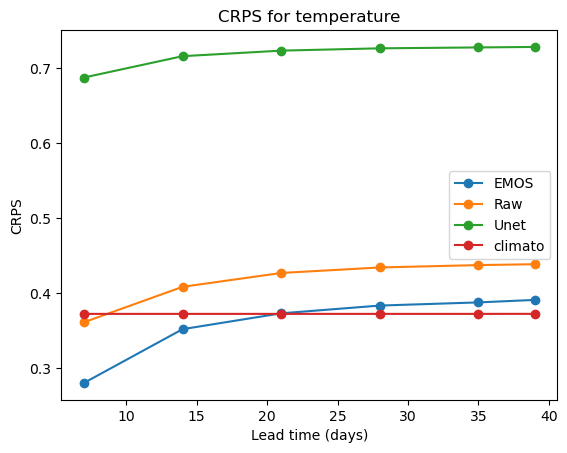

In [25]:
lead_times= [7,14,21,28,35,39]

emos_year_temp.plot(label='EMOS', marker='o')
raw_year_temp.plot(label='Raw', marker='o')
#clim_year_temp.plot(label='Climatology', marker='o')
lats = ds_lead.latitude
weights = np.cos(np.deg2rad(lats))
plt.title("CRPS for temperature")
plt.plot(lead_times, (ds_lead["crps_temperature"] * land_sea_mask).weighted(weights).mean(dim=('latitude', 'longitude')), label="Unet", marker='o')
plt.plot(lead_times, (ds_lead["crps_temperature_climato"] * land_sea_mask).weighted(weights).mean(dim=('latitude', 'longitude')), label="climato", marker='o')
plt.xlabel("Lead time (days)")
plt.ylabel("CRPS")  
plt.legend()
plt.show()

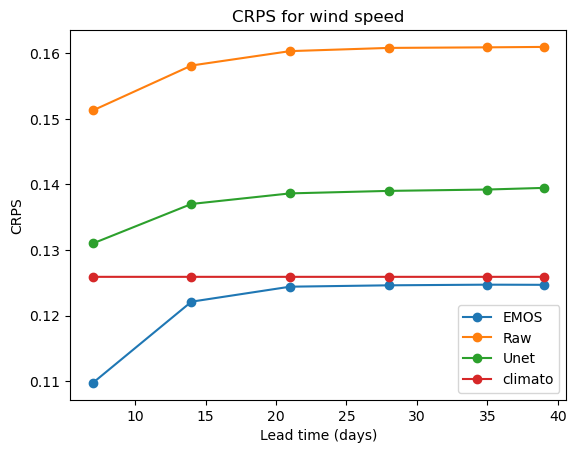

In [26]:
emos_year_wind.plot(label='EMOS', marker='o')
raw_year_wind.plot(label='Raw', marker='o')
plt.title("CRPS for wind speed")
plt.plot(lead_times, (ds_lead["crps_wind_speed"] * land_sea_mask).weighted(weights).mean(dim=('latitude', 'longitude')), label="Unet", marker='o')
plt.plot(lead_times, (ds_lead["crps_wind_speed_climato"] * land_sea_mask).weighted(weights).mean(dim=('latitude', 'longitude')), label="climato", marker='o')
plt.xlabel("Lead time (days)")
plt.ylabel("CRPS")  
plt.legend()
plt.show()

## CRPSS

In [7]:
# DRUnet
crpss_temp_ds = 1 - ds["crps_temperature"].groupby('lead_time').mean(dim='time')    / ds["crps_temperature_climato"].groupby('lead_time').mean(dim='time')   
crpss_wind_ds = 1 - ds["crps_wind_speed"].groupby('lead_time').mean(dim='time')    / ds["crps_wind_speed_climato"].groupby('lead_time').mean(dim='time')
crpss_temp_ds

<xarray.DataArray (lead_time: 6, latitude: 100, longitude: 240)>
array([[[-0.60422206, -0.55282843, -0.47884238, ..., -0.41878748,
         -0.42247963, -0.5750166 ],
        [-0.35890734, -0.35738218, -0.34488916, ..., -0.2917229 ,
         -0.32996106, -0.38711727],
        [-0.2521714 , -0.24536347, -0.24230766, ..., -0.23056293,
         -0.23525691, -0.2542199 ],
        ...,
        [-2.0312343 , -1.5109029 , -1.3917768 , ..., -1.4564834 ,
         -1.4796486 , -1.641675  ],
        [-2.4226427 , -1.9933982 , -1.9378397 , ..., -1.8519619 ,
         -1.7577341 , -2.0955193 ],
        [-3.176031  , -3.0772061 , -3.0841904 , ..., -3.107975  ,
         -3.417704  , -3.7050734 ]],

       [[-0.6168448 , -0.583092  , -0.5201144 , ..., -0.48937786,
         -0.464545  , -0.5986693 ],
        [-0.39600694, -0.40209746, -0.40294838, ..., -0.35015202,
         -0.37692153, -0.4144386 ],
        [-0.2944721 , -0.29292512, -0.294829  , ..., -0.27802885,
         -0.27802682, -0.2873237 ],
...
        [-2.0970643 , -1.585114  , -1.462915  , ..., -1.546716  ,
         -1.5939555 , -1.7684617 ],
        [-2.4997196 , -2.0728629 , -2.0087051 , ..., -1.9331994 ,
         -1.865771  , -2.2165453 ],
        [-3.2185001 , -3.130046  , -3.1483488 , ..., -3.1698232 ,
         -3.4803033 , -3.747095  ]],

       [[-0.70980585, -0.70079935, -0.6168139 , ..., -0.56874144,
         -0.53118384, -0.6801691 ],
        [-0.50431216, -0.5086516 , -0.4966371 , ..., -0.4236679 ,
         -0.44501126, -0.49677444],
        [-0.35858703, -0.37372303, -0.37240052, ..., -0.32245994,
         -0.33263803, -0.36309314],
        ...,
        [-2.1070688 , -1.5916269 , -1.4625111 , ..., -1.5617647 ,
         -1.6122487 , -1.7822948 ],
        [-2.5227396 , -2.0902843 , -2.0217822 , ..., -1.9518127 ,
         -1.8856115 , -2.2360134 ],
        [-3.2757382 , -3.1858463 , -3.2018857 , ..., -3.2218943 ,
         -3.5396876 , -3.8095288 ]]], dtype=float32)
Coordinates:
  * longitude  (longitude) float64 0.0 1.5 3.0 4.5 ... 354.0 355.5 357.0 358.5
  * latitude   (latitude) float64 -58.5 -57.0 -55.5 -54.0 ... 87.0 88.5 90.0
  * lead_time  (lead_time) int64 1 2 3 4 5 6

In [27]:
# EMOS, RAW
emos_temp_crpss_ds = (1 - emos_temp_ds.groupby('lead_time').mean(dim='forecast_idx') / clim_temp_ds.groupby('lead_time').mean(dim='forecast_idx')) 
raw_temp_crpss_ds = (1 - raw_temp_ds.groupby('lead_time').mean(dim='forecast_idx') / clim_temp_ds.groupby('lead_time').mean(dim='forecast_idx')) 
emos_wind_crpss_ds = (1 - emos_wind_ds.groupby('lead_time').mean(dim='forecast_idx') / clim_wind_ds.groupby('lead_time').mean(dim='forecast_idx')) 
raw_wind_crpss_ds = (1 - raw_wind_ds.groupby('lead_time').mean(dim='forecast_idx') / clim_wind_ds.groupby('lead_time').mean(dim='forecast_idx') )
emos_temp_crpss_ds

<xarray.DataArray (lead_time: 6, latitude: 121, longitude: 240)>
array([[[ 1.7012894e-01,  1.7541790e-01,  1.7313015e-01, ...,
          1.7506289e-01,  1.7033201e-01,  1.7123955e-01],
        [ 1.8092042e-01,  1.7742944e-01,  1.7980570e-01, ...,
          1.7839098e-01,  1.8085772e-01,  1.7849118e-01],
        [ 1.6879064e-01,  1.7203081e-01,  1.7216742e-01, ...,
          1.6732800e-01,  1.6792572e-01,  1.6909945e-01],
        ...,
        [ 1.3404524e-01,  1.3196921e-01,  1.3046658e-01, ...,
          1.3366562e-01,  1.3418961e-01,  1.3385284e-01],
        [ 1.3210797e-01,  1.3020521e-01,  1.3388973e-01, ...,
          1.2481779e-01,  1.3206732e-01,  1.3252711e-01],
        [ 1.4133489e-01,  1.4303958e-01,  1.4050227e-01, ...,
          1.3953459e-01,  1.3932228e-01,  1.3690561e-01]],

       [[-2.1563768e-03, -5.8885813e-03, -6.3891411e-03, ...,
         -3.7631989e-03, -3.3683777e-03, -6.8898201e-03],
        [-1.3756752e-03, -3.0434132e-04,  3.3974648e-05, ...,
         -1.3921261e-03, -1.7420053e-03, -8.0764294e-04],
        [-1.1587143e-04,  8.0311298e-04,  3.1400323e-03, ...,
          1.6641617e-03,  8.4286928e-04,  2.7579665e-03],
...
        [-5.9447765e-02, -5.5530190e-02, -6.5728307e-02, ...,
         -5.0278664e-02, -5.0321579e-02, -4.0287971e-02],
        [-8.5000277e-02, -9.1849446e-02, -9.4167590e-02, ...,
         -9.1018677e-02, -8.8903069e-02, -9.0974450e-02],
        [-7.6519847e-02, -6.5326571e-02, -6.8838835e-02, ...,
         -7.8704834e-02, -7.7939868e-02, -7.7877283e-02]],

       [[-2.3353457e-02, -1.6850710e-02, -1.6991258e-02, ...,
         -1.9121051e-02, -1.9276857e-02, -1.8810391e-02],
        [-1.5959024e-02, -2.5753260e-02, -1.5402436e-02, ...,
         -2.0226002e-02, -1.5382886e-02, -1.8912315e-02],
        [-1.9976139e-02, -1.6369224e-02, -1.4313817e-02, ...,
         -1.5119314e-02, -1.6281605e-02, -2.0583153e-02],
        ...,
        [-8.2986355e-03, -9.8823309e-03, -1.1334062e-02, ...,
         -3.8521290e-03, -7.6696873e-03, -6.7037344e-03],
        [-5.3513765e-02, -5.3385735e-02, -5.1017880e-02, ...,
         -5.4484963e-02, -5.5255294e-02, -5.5390239e-02],
        [-6.2708259e-02, -6.0104728e-02, -6.8803310e-02, ...,
         -6.7306519e-02, -7.0074201e-02, -6.5288186e-02]]], dtype=float32)
Coordinates:
  * lead_time  (lead_time) int64 7 14 21 28 35 39
  * latitude   (latitude) float64 -90.0 -88.5 -87.0 -85.5 ... 87.0 88.5 90.0
  * longitude  (longitude) float64 0.0 1.5 3.0 4.5 ... 354.0 355.5 357.0 358.5

In [28]:
crpss_temp_emos = weight_latitude(21, emos_temp_crpss_ds, type="crpss")
crpss_wind_emos = weight_latitude(21, emos_wind_crpss_ds, type="crpss")
crpss_temp_raw = weight_latitude(21, raw_temp_crpss_ds, type="crpss") 
crpss_wind_raw = weight_latitude(21, raw_wind_crpss_ds, type="crpss")
crpss_temp_emos

<xarray.DataArray (lead_time: 6)>
array([ 0.06810547,  0.01786748,  0.00307352, -0.00450029, -0.00730967,
       -0.0091636 ])
Coordinates:
  * lead_time  (lead_time) int64 7 14 21 28 35 39

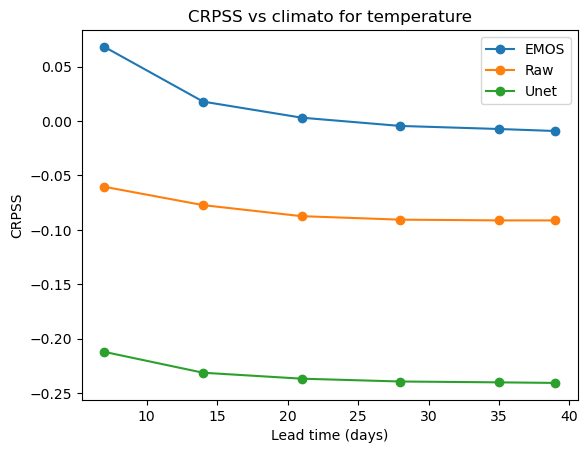

In [29]:
plt.title("CRPSS vs climato for temperature")
plt.plot(lead_times, crpss_temp_emos, label="EMOS", marker='o')
plt.plot(lead_times, crpss_temp_raw, label="Raw", marker='o')
plt.plot(lead_times, (crpss_temp_ds * land_sea_mask).weighted(weights).mean(dim=('latitude', 'longitude')), label="Unet", marker='o')
plt.xlabel("Lead time (days)")
plt.ylabel("CRPSS")
plt.legend()
plt.show()


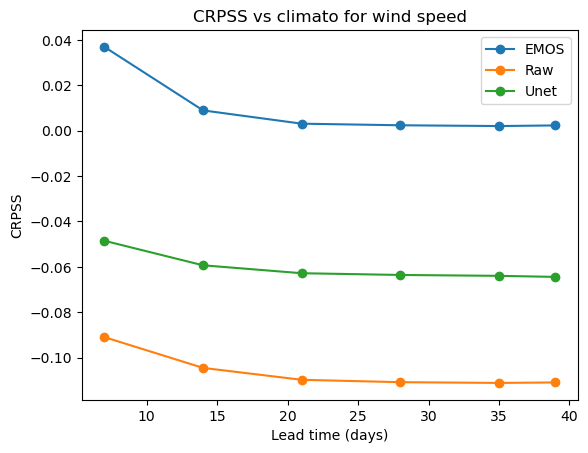

In [56]:
plt.title("CRPSS vs climato for wind speed")
plt.plot(lead_times, crpss_wind_emos, label="EMOS", marker='o')
plt.plot(lead_times, crpss_wind_raw, label="Raw", marker='o')
plt.plot(lead_times, (crpss_wind_ds * land_sea_mask).weighted(weights).mean(dim=('latitude', 'longitude')), label="Unet", marker='o')
plt.xlabel("Lead time (days)")
plt.ylabel("CRPSS")
plt.legend()
plt.show()


In [30]:
# by latitude zone
def weight_latitude_zone(lat_beg_idx, ds_crps, type, cutoff_mask=0.5):
    # mask 
    obs_folder = "/home/majanvie/scratch/data/raw/obs"
    land_sea_mask = xr.open_dataset(f"{obs_folder}/land_sea_mask.nc").land_sea_mask.values.T[lat_beg_idx:,:]
    land_sea_mask = land_sea_mask > cutoff_mask
    # remove problematic pixel
    land_sea_mask[77-lat_beg_idx,19] = 0

    # compute yearly crps per lead time
    if type == "crps":
        ds_mean = ds_crps.mean(dim='forecast_idx')[:,lat_beg_idx:, :]
    elif type == "crpss":
        ds_mean = ds_crps[:,lat_beg_idx:, :]
    # weights per latitude 
    lats = ds_mean.latitude
    weights = np.cos(np.deg2rad(lats))
    crps_year = (ds_mean*land_sea_mask)
    crps_lat = {
        "land": crps_year.weighted(weights).mean(dim=('latitude', 'longitude')),
        "90-30N": crps_year.sel(latitude=slice(30, 90)).weighted(weights.sel(latitude=slice(30, 90))).mean(dim=('latitude', 'longitude')),
        "30S-30N": crps_year.sel(latitude=slice(-30, 30)).weighted(weights.sel(latitude=slice(-30, 30))).mean(dim=('latitude', 'longitude')),
        "30-90S": crps_year.sel(latitude=slice(-90, -30)).weighted(weights.sel(latitude=slice(-90, -30))).mean(dim=('latitude', 'longitude'))
            }
    return crps_lat



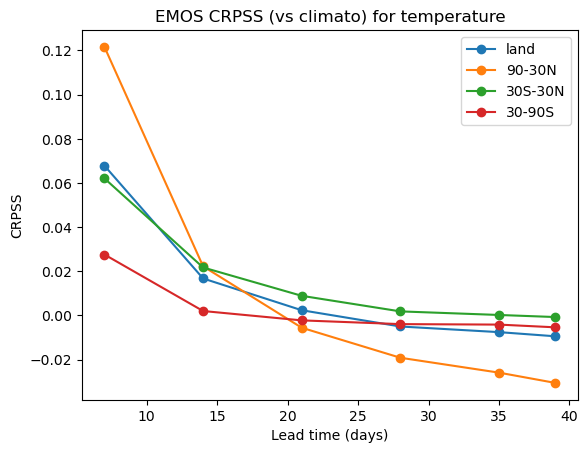

In [31]:
crpss_lat_emos = weight_latitude_zone(0, emos_temp_crpss_ds, type="crpss")
for key in crpss_lat_emos:
    plt.plot(lead_times, crpss_lat_emos[key], label=key, marker='o')
plt.title("EMOS CRPSS (vs climato) for temperature")
plt.xlabel("Lead time (days)")
plt.ylabel("CRPSS")
plt.legend()
plt.show()

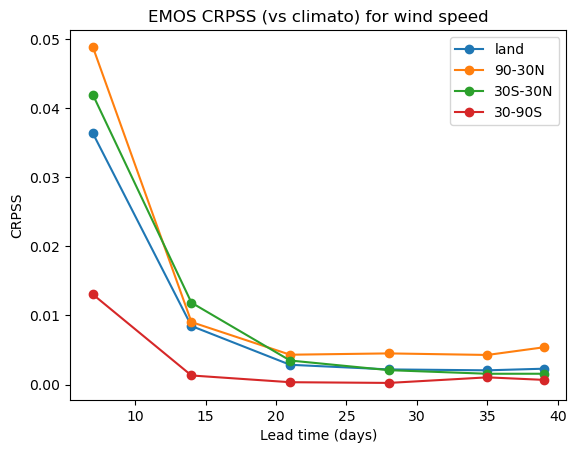

In [32]:
crpss_emos_wind = weight_latitude_zone(0, emos_wind_crpss_ds, type="crpss")
for key in crpss_emos_wind:
    plt.plot(lead_times, crpss_emos_wind[key], label=key, marker='o')
plt.title("EMOS CRPSS (vs climato) for wind speed")
plt.xlabel("Lead time (days)")
plt.ylabel("CRPSS")
plt.legend()
plt.show()

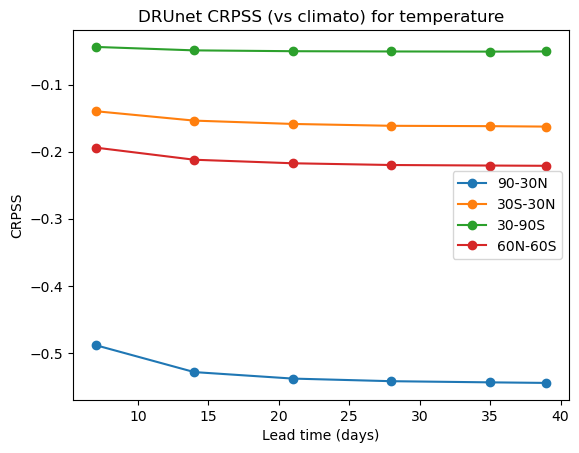

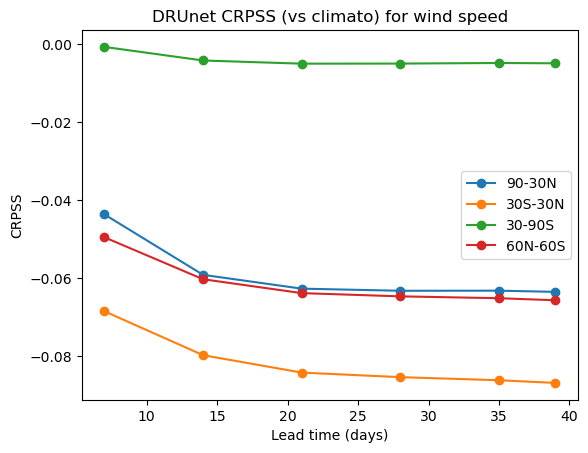

In [58]:
# DRUnet
plt.plot(lead_times, (crpss_temp_ds*land_sea_mask).sel(latitude=slice(30, 90)).weighted(weights.sel(latitude=slice(30, 90))).mean(dim=('latitude', 'longitude')), label="90-30N", marker='o')
plt.plot(lead_times, (crpss_temp_ds*land_sea_mask).sel(latitude=slice(-30, 30)).weighted(weights.sel(latitude=slice(-30, 30))).mean(dim=('latitude', 'longitude')), label="30S-30N", marker='o')
plt.plot(lead_times, (crpss_temp_ds*land_sea_mask).sel(latitude=slice(-90, -30)).weighted(weights.sel(latitude=slice(-90, -30))).mean(dim=('latitude', 'longitude')), label="30-90S", marker='o')
plt.plot(lead_times, (crpss_temp_ds*land_sea_mask).sel(latitude=slice(-60, 60)).weighted(weights.sel(latitude=slice(-60, 60))).mean(dim=('latitude', 'longitude')), label="60N-60S", marker='o')
plt.title("DRUnet CRPSS (vs climato) for temperature")
plt.xlabel("Lead time (days)")
plt.ylabel("CRPSS")
plt.legend()
plt.show()

plt.plot(lead_times, (crpss_wind_ds*land_sea_mask).sel(latitude=slice(30, 90)).weighted(weights.sel(latitude=slice(30, 90))).mean(dim=('latitude', 'longitude')), label="90-30N", marker='o')
plt.plot(lead_times, (crpss_wind_ds*land_sea_mask).sel(latitude=slice(-30, 30)).weighted(weights.sel(latitude=slice(-30, 30))).mean(dim=('latitude', 'longitude')), label="30S-30N", marker='o')
plt.plot(lead_times, (crpss_wind_ds*land_sea_mask).sel(latitude=slice(-90, -30)).weighted(weights.sel(latitude=slice(-90, -30))).mean(dim=('latitude', 'longitude')), label="30-90S", marker='o')
plt.plot(lead_times, (crpss_wind_ds*land_sea_mask).sel(latitude=slice(-60, 60)).weighted(weights.sel(latitude=slice(-60, 60))).mean(dim=('latitude', 'longitude')), label="60N-60S", marker='o')
plt.title("DRUnet CRPSS (vs climato) for wind speed")
plt.xlabel("Lead time (days)")
plt.ylabel("CRPSS")
plt.legend()
plt.show()

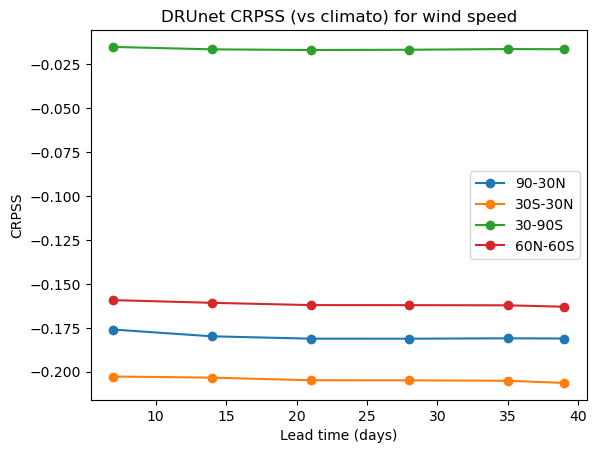

In [51]:
plt.plot(lead_times, (crpss_wind_ds*land_sea_mask).sel(latitude=slice(30, 90)).weighted(weights.sel(latitude=slice(30, 90))).mean(dim=('latitude', 'longitude')), label="90-30N", marker='o')
plt.plot(lead_times, (crpss_wind_ds*land_sea_mask).sel(latitude=slice(-30, 30)).weighted(weights.sel(latitude=slice(-30, 30))).mean(dim=('latitude', 'longitude')), label="30S-30N", marker='o')
plt.plot(lead_times, (crpss_wind_ds*land_sea_mask).sel(latitude=slice(-90, -30)).weighted(weights.sel(latitude=slice(-90, -30))).mean(dim=('latitude', 'longitude')), label="30-90S", marker='o')
plt.plot(lead_times, (crpss_wind_ds*land_sea_mask).sel(latitude=slice(-60, 60)).weighted(weights.sel(latitude=slice(-60, 60))).mean(dim=('latitude', 'longitude')), label="60N-60S", marker='o')
plt.title("DRUnet CRPSS (vs climato) for wind speed")
plt.xlabel("Lead time (days)")
plt.ylabel("CRPSS")
plt.legend()
plt.show()

# 2. Maps

In [69]:
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr

def plot_lead(ds, variable, model, type, lat_idx_beg=None, projection=ccrs.PlateCarree()):
    """
    Plots CRPS or CRPSS for different lead times in a 2x3 grid.

    Parameters:
    ds (xarray.Dataset): Dataset containing the CRPSS data.
    variable (str): The variable to plot (e.g., temperature).
    model (str): The model used (e.g., EMOS).
    lead_times (list): List of lead times to plot. If None, it defaults to the first 6 lead times in the dataset.
    projection (cartopy.crs): Cartopy coordinate reference system to project the data onto.
    """
    lead_times = [7, 14, 21, 28, 35, 39]  # Default lead times
    if type == "CRPSS":
        cmap='coolwarm'
        norm = plt.Normalize(vmin=-1, vmax=1)
        
    else:
        #vmin, vmax = ds.min().item(), ds.max().item()
        norm = plt.Normalize(vmin=0, vmax=5)
        cmap='viridis'

    fig, axs = plt.subplots(2, 3, figsize=(20, 10), subplot_kw={'projection': projection})
    fig.suptitle(f"{model} {type} for {variable}", fontsize=16)
    
    
    if lat_idx_beg is None:
        lon_min, lon_max = 0,358.5 #ds.longitude.min().item(), ds.longitude.max().item()
        lat_min, lat_max = -90,90 #ds.latitude.min().item(), ds.latitude.max().item()
    else:
        lon_min, lon_max = 0,358.5
        lat_min, lat_max = ds.latitude.min().item(), ds.latitude.max().item()
    print(lon_min, lon_max, lat_min, lat_max)

    for i in range(6):
        ax = axs[i//3, i%3]
        ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())
        ax.coastlines()
        if lat_idx_beg is None:
            lead_idx = lead_times[i]
        else:
            lead_idx = round(lead_times[i]/7)
        im = ax.imshow(ds.sel(lead_time=lead_idx).values, origin='lower', extent=[lon_min, lon_max+1.5, lat_min, lat_max], transform=ccrs.PlateCarree(), cmap=cmap, norm=norm)
        ax.set_title(f"Lead time {lead_times[i]} days")
        
    # Add a colorbar that spans all subplots
    cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])  # [left, bottom, width, height]
    fig.colorbar(im, cax=cbar_ax, label=type, extend='both', norm=norm)
    plt.show()
    


## CRPS

0 358.5 -90 90


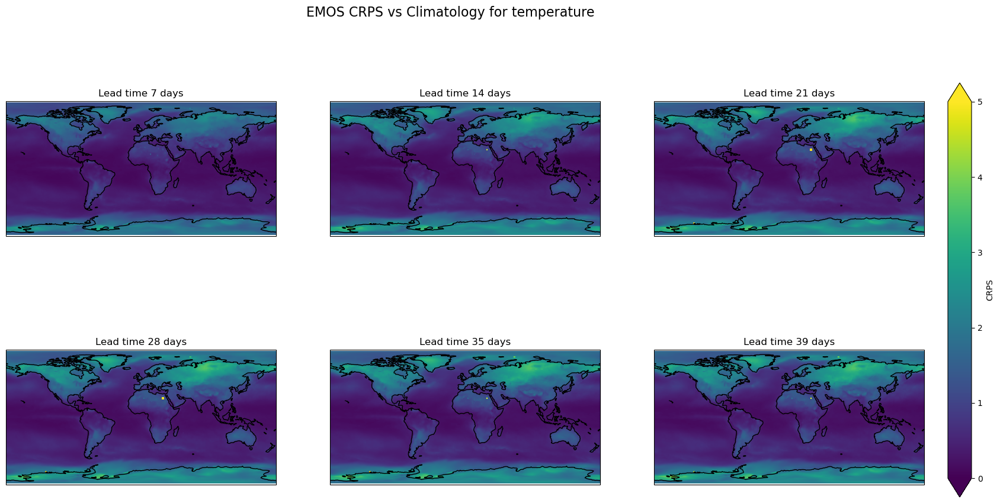

In [62]:
plot_lead(emos_temp_ds.groupby('lead_time').mean(dim='forecast_idx'), "temperature", "EMOS", type="CRPS")

0 358.5 -90 90


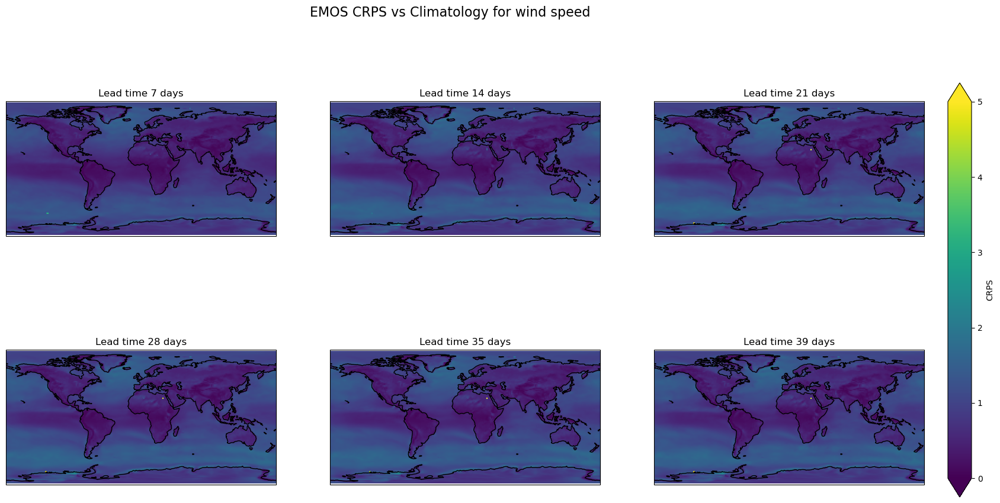

In [63]:
plot_lead(emos_wind_ds.groupby('lead_time').mean(dim='forecast_idx'), "wind speed", "EMOS", type="CRPS")

0 358.5 -58.5 90.0


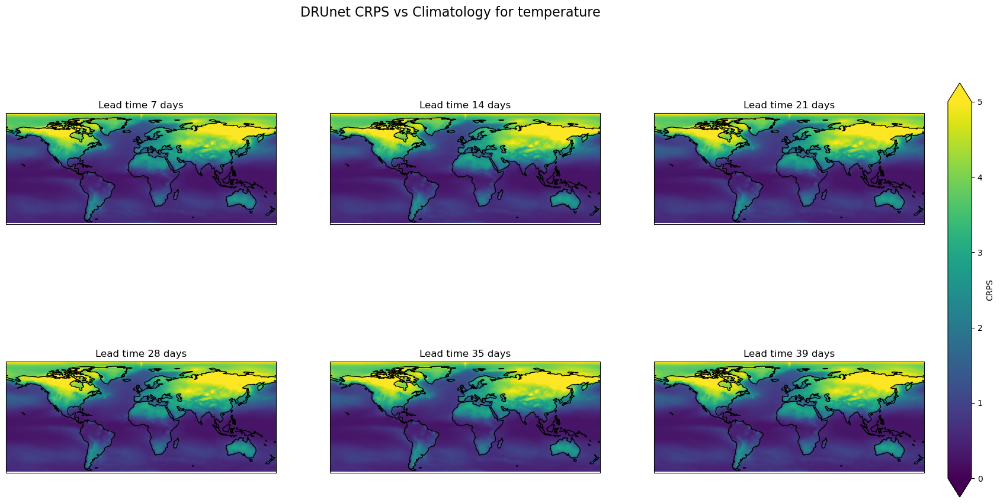

In [70]:
plot_lead(ds_lead["crps_temperature"], "temperature", "DRUnet", type="CRPS", lat_idx_beg=21)

0 358.5 -58.5 90.0


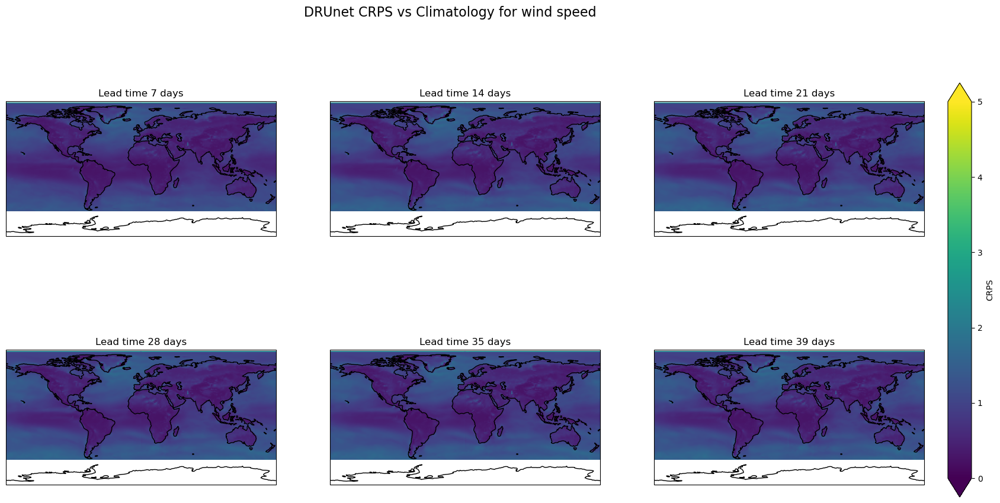

In [68]:
plot_lead(ds_lead["crps_wind_speed"], "wind speed", "DRUnet", type="CRPS", lat_idx_beg=21)

0 358.5 -58.5 90.0


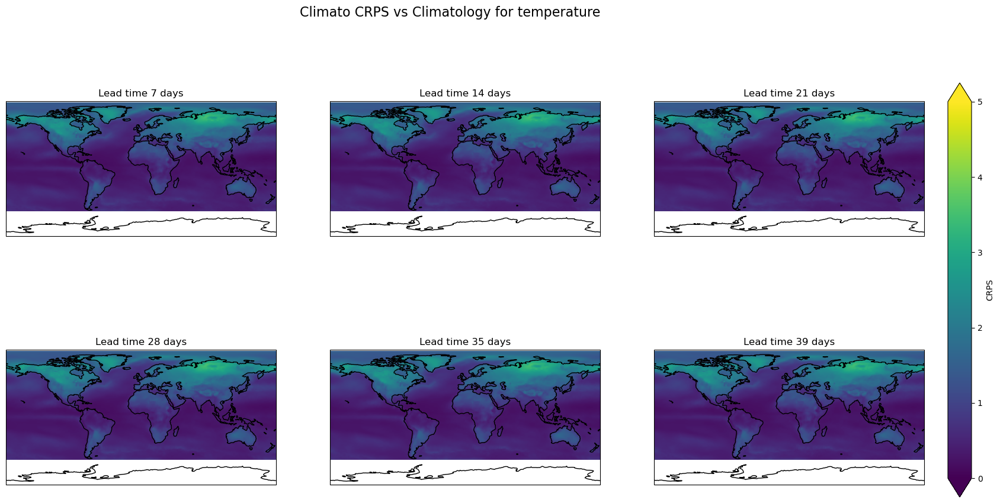

In [67]:
plot_lead(ds_lead["crps_temperature_climato"], "temperature", "Climato", type="CRPS", lat_idx_beg=21)

## CRPSS

0 358.5 -90 90


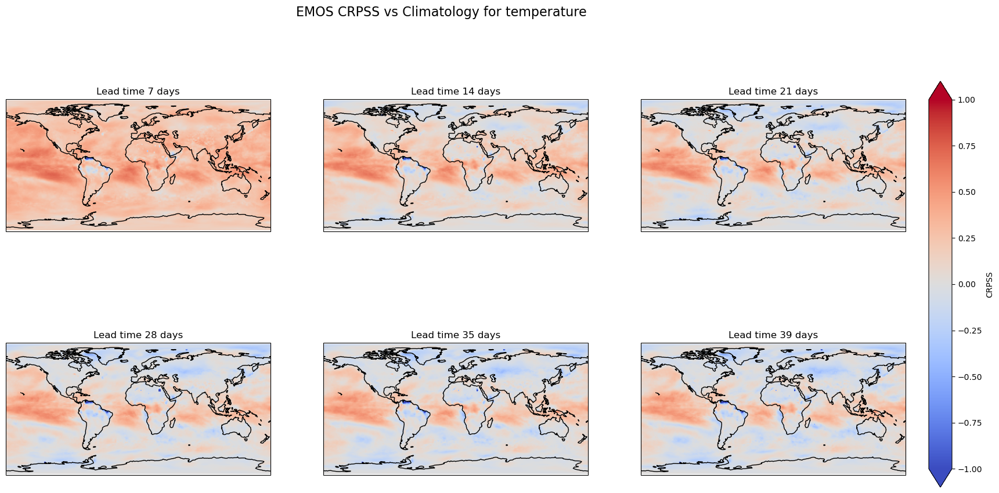

In [53]:
plot_lead(emos_temp_crpss_ds, "temperature", "EMOS", type="CRPSS")

0 358.5 -90 90


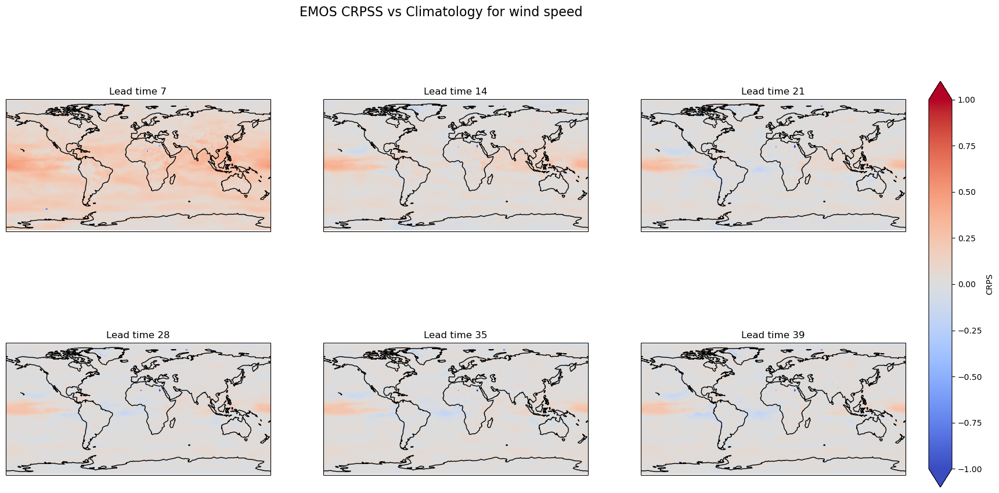

In [38]:
plot_crpss_lead(emos_wind_crpss_ds, "wind speed", "EMOS", "CRPSS")


0 358.5 -90 90


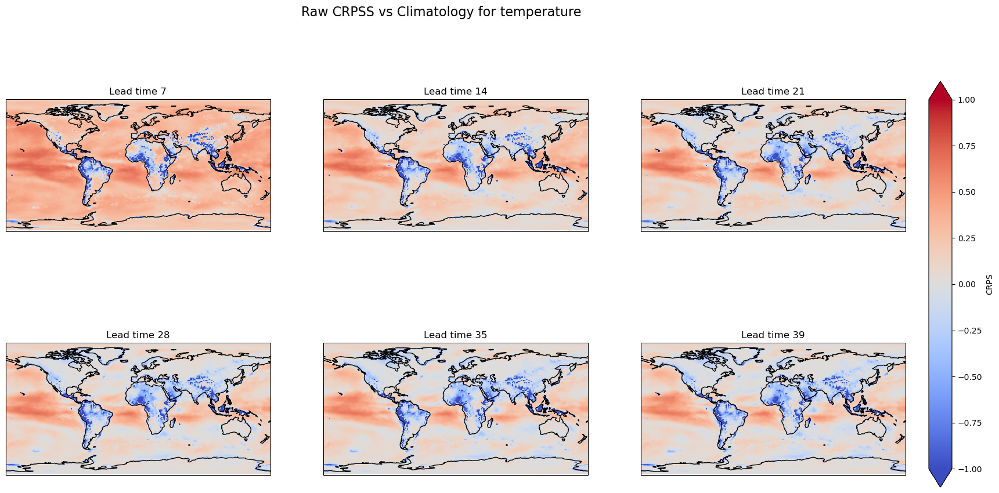

In [39]:
plot_crpss_lead(raw_temp_crpss_ds, "temperature", "Raw", "CRPSS")

0 358.5 -90 90


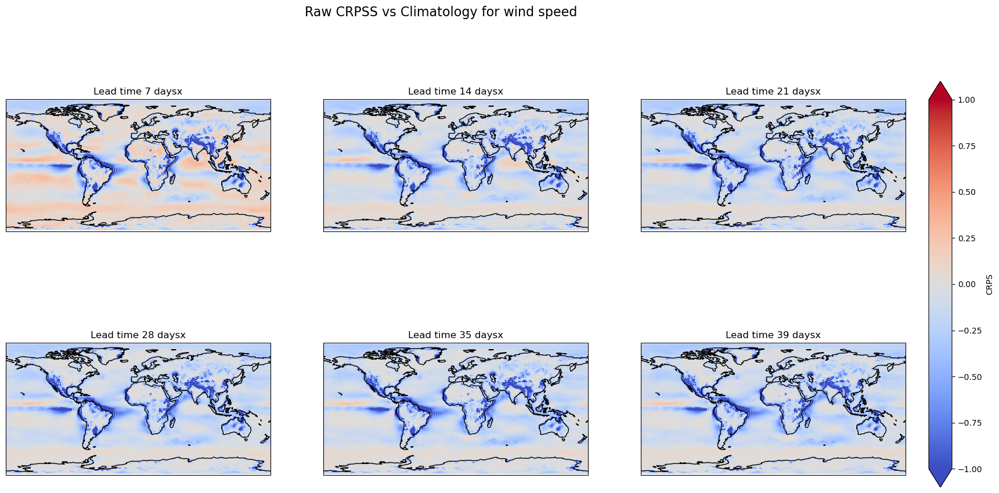

In [48]:
plot_crpss_lead(raw_wind_crpss_ds, "wind speed", "Raw", "CRPSS")

0 358.5 -58.5 90.0


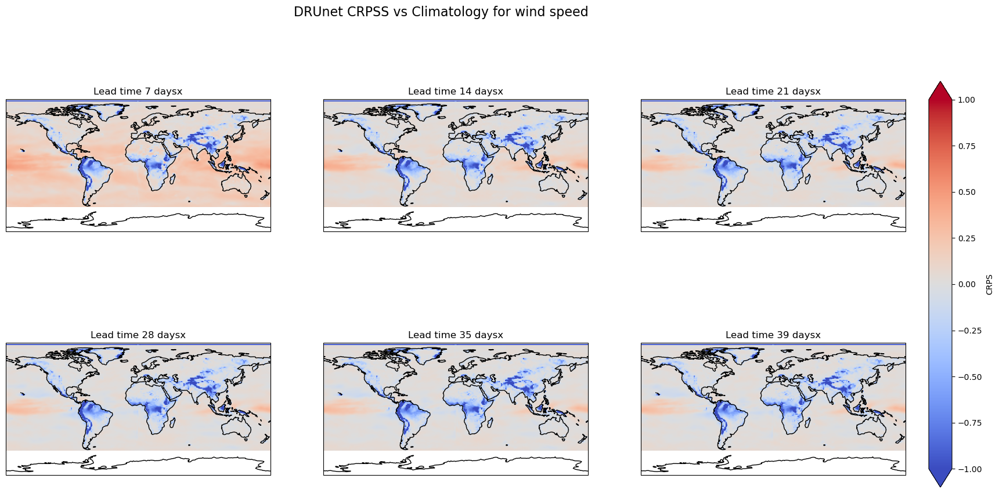

In [46]:
plot_crpss_lead(crpss_wind_ds, "wind speed", "DRUnet", "CRPSS", lat_idx_beg=21)

0 358.5 -58.5 90.0


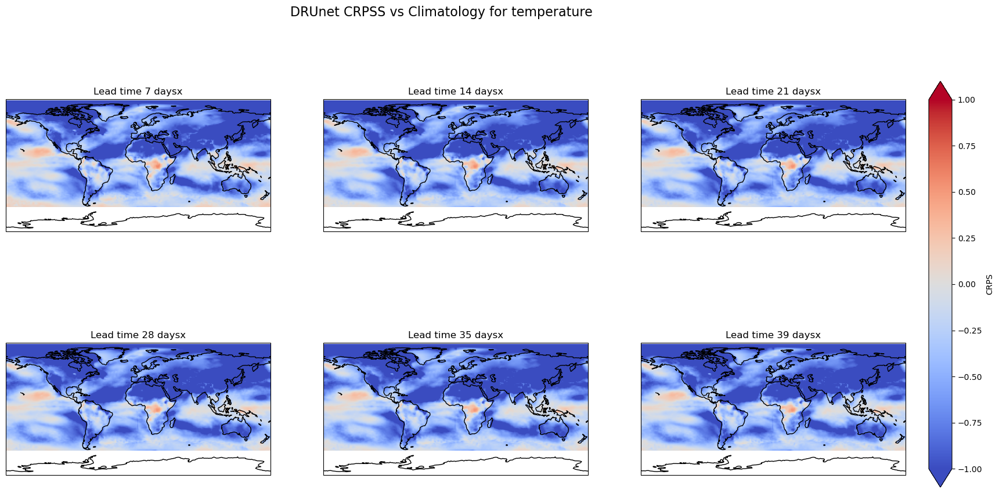

In [47]:
plot_crpss_lead(crpss_temp_ds, "temperature", "DRUnet", "CRPSS", lat_idx_beg=21)